In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [2]:
import itertools

import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

from paderbox.visualization import plot, context_manager
from padercontrib.database.keys import *
from padercontrib.database.iterator import AudioReader
from paderbox.transform import stft, istft
from paderbox.array import interval
from padercontrib.visualization.database_to_html import display_database_html

from padercontrib.database.fearless import Fearless

/net/home/bibash_01/my_project/.venv/lib/python3.7/site-packages/paderbox/array/intervall.py:6: UserWarning: Using ArrayIntervall (with double l) from paderbox.array.intervall (with double l) is deprecated. Use ArrayInterval from paderbox.array.interval (with a single l) instead.
  'Using ArrayIntervall (with double l) from paderbox.array.intervall (with '


In [3]:
db = Fearless()
db

Fearless(PosixPath('/net/vol/jenkins/jsons/fearless.json'))

In [4]:
db.dataset_names

('Dev_SID',
 'Dev_segment',
 'Dev_stream',
 'Eval_SID',
 'Eval_segment',
 'Eval_stream',
 'Train_SID',
 'Train_segment',
 'Train_stream')

## Streams

In [5]:
datasets = [
 'Dev_stream',
 'Eval_stream',
 'Train_stream',
]
datasets

['Dev_stream', 'Eval_stream', 'Train_stream']

###  Dev Stream

In [6]:
dataset_Dev_str = db.get_dataset('Dev_stream')
df_dev_str = pd.DataFrame(dataset_Dev_str)
#df_dev_str = df_dev_str.drop(columns=['audio_path', 'example_id'])
df_dev_str.head()

,audio_path,end,num_samples,num_speakers,speaker_id,start,transcription,example_id,dataset
0,{'observation': '/net/db/fearless/Audio/Stream...,"[1716960, 1724240, 1738480, 1742720, 1967600, ...",14816000,8,"[PROCEDURES1, FD1, PROCEDURES1, FD1, CONTROL1,...","[1710480, 1716960, 1724720, 1739440, 1955360, ...","[FLIGHT PROCEDURES., Go PROCEDURES., Upper clo...",FS02_dev_001,Dev_stream
1,{'observation': '/net/db/fearless/Audio/Stream...,"[24800, 128560, 143040, 164080, 172320, 206240...",14400000,30,"[EECOM3, TRACK0, MADRID, TRACK0, EECOM3, MADRI...","[16800, 123360, 140320, 148560, 164080, 176000...","[SPAN EECOM conference., MADRID TRACK., MADRID...",FS02_dev_002,Dev_stream
2,{'observation': '/net/db/fearless/Audio/Stream...,"[98400, 158960, 169680, 262480, 526720, 767200...",14400000,26,"[CAPCOM1, EMU, FD1, BUZZ, BUZZ, BUZZ, NEIL, BU...","[36320, 98400, 162720, 169680, 285840, 544480,...","[Uh roger BUZZ, and break break COLUMBIA this ...",FS02_dev_003,Dev_stream
3,{'observation': '/net/db/fearless/Audio/Stream...,"[748080, 760480, 770000, 802720, 826080, 88120...",14955294,11,"[RETRO1, FIDO1, RETRO1, UNK, FIDO1, RETRO1, FI...","[739600, 757520, 761920, 797040, 815840, 84056...","[FIDO this is RETRO., Go ahead., Did you get t...",FS02_dev_004,Dev_stream
4,{'observation': '/net/db/fearless/Audio/Stream...,"[28240, 102000, 146320, 182160, 258720, 376480...",14400000,14,"[CAPCOM1, BUZZ, CAPCOM1, BUZZ, CAPCOM1, BUZZ, ...","[0, 61920, 103840, 172560, 190080, 337840, 390...",[Is HOUSTON uh radio check and verify T.V. cir...,FS02_dev_005,Dev_stream


In [15]:
zipped = zip(df_dev_str['start'][0], df_dev_str['end'][0], df_dev_str['transcription'][0])
list(zipped)

[(1710480, 1716960, 'FLIGHT PROCEDURES.'),
 (1716960, 1724240, 'Go PROCEDURES.'),
 (1724720, 1738480, 'Upper clocks had C.S.M. SEP'),
 (1739440, 1742720, 'Rog.'),
 (1955360, 1967600, 'CAPCOM CONTROL on MOCR two.'),
 (2813280, 2819280, 'CONTROL from FLIGHT.'),
 (2828720, 2833600, 'Go ahead FLIGHT.'),
 (2834880,
  2855120,
  'You get a chance to look at your PIPAs after that last bias update?'),
 (2855120,
  2936960,
  "Roger they were right on the money with the previous. One. I'm trying to run the ground right now and find out uh who made the calc and uh what his delta time was and his PIPA counts were. Trying to find out how it came about."),
 (2938240, 2950960, "What you're saying is we got the right bias in?"),
 (2952240, 2956240, 'Roger.'),
 (2956960, 2959680, 'Okay.'),
 (2959680,
  3003280,
  "We don't want to update it it's okay as is and has previously updated. Okay?"),
 (3017840, 3020560, 'Okay.'),
 (3780640, 3785680, 'FIDO from FLIGHT.'),
 (3797280, 3801760, 'FLIGHT FIDO.'),
 

In [16]:
diff = []
for i in range(len(df_dev_str)):
    diff.append((np.subtract(df_dev_str['end'][i], df_dev_str['start'][i])/8000))
df_dev_str['speech_time'] = diff 

### Train Stream

In [17]:
dataset_Train_str = db.get_dataset('Train_stream')
df_tr_str = pd.DataFrame(dataset_Train_str)
#df_tr_str = df_tr_str.drop(columns=['audio_path', 'example_id'])
df_tr_str.head()

,audio_path,end,num_samples,num_speakers,speaker_id,start,transcription,example_id,dataset
0,{'observation': '/net/db/fearless/Audio/Stream...,"[71040, 99920, 171120, 204320, 209840, 234160,...",14400000,45,"[HOUSTONCOMMTECH2, NETWORK3, HOUSTONCOMMTECH2,...","[0, 73280, 107680, 171120, 205280, 213600, 240...",[To it about three different Pass. He's gettin...,FS02_train_001,Train_stream
1,{'observation': '/net/db/fearless/Audio/Stream...,"[45760, 142560, 195120, 226240, 254080, 257279...",14400000,24,"[FD1, CAPCOM2, FD1, CAPCOM2, GUIDANCE4, FD1, G...","[19840, 61440, 143840, 200720, 248720, 254080,...",[Okay that must mean he's gone through the AGS...,FS02_train_002,Train_stream
2,{'observation': '/net/db/fearless/Audio/Stream...,"[8720, 25920, 35280, 41840, 43360, 51200, 6520...",14400000,20,"[FD1, CONTROL1, CAPCOM2, GUIDANCE4, FD1, CONTR...","[0, 23280, 27040, 35280, 41840, 44320, 51200, ...","[Improper switch position., Oh, He's trying to...",FS02_train_003,Train_stream
3,{'observation': '/net/db/fearless/Audio/Stream...,"[16800, 20800, 32640, 45760, 49680, 74960, 118...",14400000,47,"[MCCFILEspk1, CVTS, NETWORK3, FD1, RTC1, MCCFI...","[0, 16800, 20800, 38560, 47440, 49680, 74960, ...",[Thing to do is to just pull the recycle immed...,FS02_train_004,Train_stream
4,{'observation': '/net/db/fearless/Audio/Stream...,"[136880, 169840, 173600, 183520, 193280, 24624...",14816000,9,"[FD1, CONTROL1, FD1, CAPCOM2, CONTROL1, CONTRO...","[129360, 138560, 170640, 176800, 184400, 24000...","[Did you copy there CONTROL?, FLIGHT it's caus...",FS02_train_005,Train_stream


## Transformation

In [18]:
import paderbox as pb
from paderbox.transform import mfcc

In [20]:
df_dev_str['audio_path'][0]

{'observation': '/net/db/fearless/Audio/Streams/Dev/FS02_dev_001.wav'}

In [21]:
df_dev_str['audio_path'][0]['observation']

'/net/db/fearless/Audio/Streams/Dev/FS02_dev_001.wav'

In [25]:
example = db.get_dataset('Train_stream')
activity = db.get_activity(example[0])
#activity
example

  DictDataset(name='Train_stream', len=125)
MapDataset(_pickle.loads)

/net/home/bibash_01/my_project/.venv/lib/python3.7/site-packages/paderbox/visualization/plot.py:41: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _, ax = plt.subplots(1, 1)


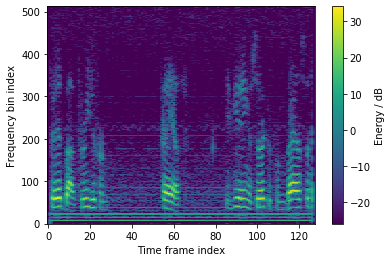

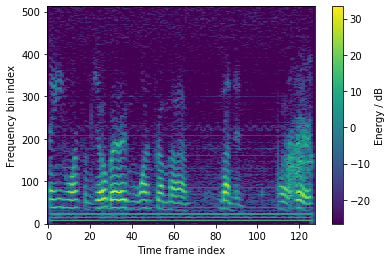

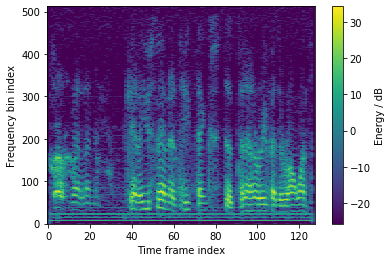

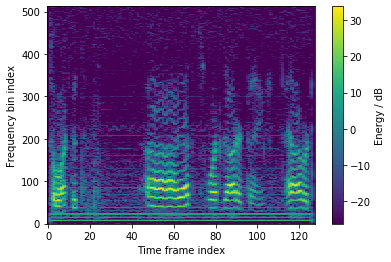

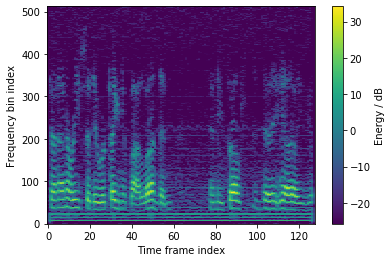

...

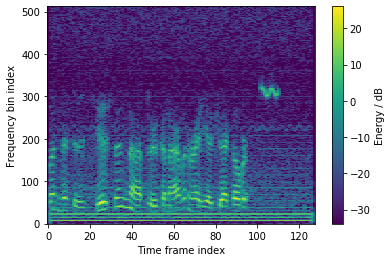

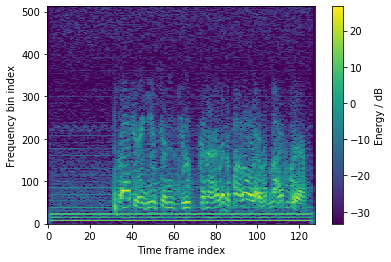

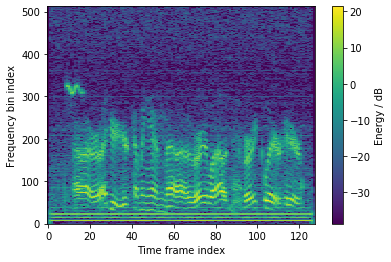

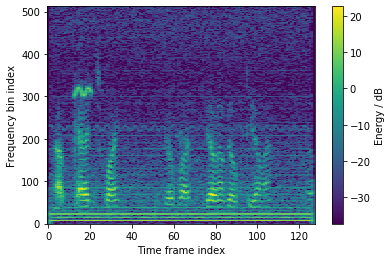

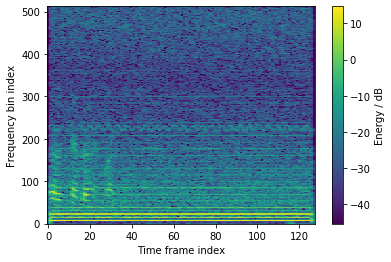

In [27]:
num_samp = 0
num_frame = 60

x_train_raw=[]
x_train = []
y_train = []
num_4sec_frames = num_frame
for i in range(num_4sec_frames):
    x_train_raw_audio = pb.io.load_audio(df_tr_str['audio_path'][num_samp]['observation'], 
                                         start = i*32000+1, frames=4*8000)
    activity = db.get_activity(example[num_samp])
    x_train.append(mfcc(x_train_raw_audio))
    x_train_raw.append(x_train_raw_audio)
    pb.io.play(x_train_raw_audio, sample_rate=8000)
    x_train_stft = stft(x_train_raw_audio)
    plot.stft(x_train_stft)
    y_train.append(any(activity[i*4*8000:(i+1)*4*8000]) & 1)

In [30]:
y_tr = []
for i in range(60): #why 60?
    y_tr.append(any(activity[i*4*8000:(i+1)*4*8000]) & 1)
print(y_tr)
len(y_tr)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


60

In [32]:
dataset_numpy = np.array(x_train)

label_numpy = np.array(y_tr)

In [37]:
x_train

[array([[-50.38437667,   4.89769656, -21.46027793, ...,  -9.39666699,
          -2.7362844 ,  21.09979746],
        [-43.26371196,   4.42778252, -32.38446587, ...,  -0.36541247,
          -9.13456318,  21.07605923],
        [-43.08024584,   5.95855469, -31.51783692, ...,  -6.2142468 ,
          -8.04201195,  16.94838736],
        ...,
        [-47.90413447,   8.20811874, -32.08608144, ...,  -2.96365318,
         -17.63717461,  18.352344  ],
        [-57.11152347,  10.24203785,  -6.63521482, ...,   1.84745148,
          -1.63225607,   1.93616429],
        [-47.73127495,   5.16643799, -26.98453215, ..., -22.87645768,
           2.55556185,   5.91902013]]),
 array([[-44.14436861,   1.8809059 , -23.94750645, ...,  -8.33980762,
           7.85726605,   8.75780522],
        [-45.73892225,   2.09174396, -15.66538763, ...,   0.71222218,
          -2.98751884,   7.95756927],
        [-47.36151328,   2.94580787,  -8.87600401, ...,   8.23561426,
          -1.09032371,   5.48485823],
        ...,


## CNN Network

In [34]:
import torch
import torch.nn.functional as F
from torch import nn
from torch import optim
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader
import numpy as np

In [38]:
dataset = torch.tensor(dataset_numpy).double()
label = torch.tensor(label_numpy).double()

In [40]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(dataset, label, test_size = 0.2)

In [41]:
x_train = X_train.reshape(48,1, 199, 13).float()
y_train = y_train.float()
x_valid =  x_train.float()
y_valid = y_train.float()

In [42]:
x_train, x_train.shape, y_train.min(), y_train.max()
print(x_train, y_train)
print(x_train.shape)
print(y_train.min(), y_train.max())

tensor([[[[-4.8673e+01, -7.8708e+00, -1.4313e+01,  ..., -7.4495e+00,
           -5.1944e+00,  1.2573e+01],
          [-4.4422e+01,  6.2143e+00, -3.9310e+01,  ...,  4.6984e+00,
            1.6117e+00,  6.7365e+00],
          [-4.1312e+01,  4.4152e+00, -5.0744e+01,  ..., -1.1600e+00,
           -4.3232e-01,  1.3309e+01],
          ...,
          [-5.6639e+01,  4.2588e+00, -4.5719e+00,  ...,  1.9296e+00,
           -1.4694e+01,  1.7720e+01],
          [-5.9759e+01,  4.9387e+00,  1.5332e+00,  ..., -6.1849e+00,
            4.5365e+00,  1.0149e+01],
          [-5.2930e+01, -3.6907e+00, -9.5784e+00,  ..., -4.4423e+00,
            6.5234e+00,  1.9466e+01]]],


        [[[-6.0353e+01,  4.3646e+00,  2.3327e+00,  ..., -3.6264e+00,
            6.0536e+00, -4.1805e+00],
          [-6.1007e+01,  4.7001e+00,  1.7590e+00,  ..., -1.2571e+00,
            1.5101e+00,  9.0340e+00],
          [-6.1046e+01,  4.9161e+00,  3.5401e+00,  ..., -7.4419e-01,
            7.8429e+00,  4.7114e+00],
          ...,
   

In [43]:
bs = 4  # batch size
xb = x_train[0:bs]  # a mini-batch from x
yb = y_train[0:bs]  # a mini-batch from y

In [44]:
lr = 0.01  # learning rate
epochs = 10  
loss_func = nn.BCELoss()

In [45]:
train_ds = TensorDataset(x_train, y_train)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True)

valid_ds = TensorDataset(x_valid, y_valid)
valid_dl = DataLoader(valid_ds, batch_size=bs * 2)

In [46]:
def get_data(train_ds, valid_ds, bs):
    return (
        DataLoader(train_ds, batch_size=bs, shuffle=True),
        DataLoader(valid_ds, batch_size=bs * 2),
    )

In [47]:
def loss_batch(model, loss_func, xb, yb, opt=None):
    loss = loss_func(model(xb), yb)

    if opt is not None:
        loss.backward()
        opt.step()
        opt.zero_grad()

    return loss.item(), len(xb)

In [50]:
def fit(epochs, model, loss_func, opt, train_dl, valid_dl):
    for epoch in range(epochs):
        model.train()
        for xb, yb in train_dl:
            loss_batch(model, loss_func, xb, yb, opt)

        model.eval()
        with torch.no_grad():
            losses, nums = zip(
                *[loss_batch(model, loss_func, xb, yb) for xb, yb in valid_dl]
            )
        val_loss = np.sum(np.multiply(losses, nums)) / np.sum(nums)

        print(epoch, val_loss)

In [51]:
def preprocess(x, y):
    return x.view(-1, 1, 199, 13), y

class WrappedDataLoader:
    def __init__(self, dl, func):
        self.dl = dl
        self.func = func

    def __len__(self):
        return len(self.dl)

    def __iter__(self):
        batches = iter(self.dl)
        for b in batches:
            yield (self.func(*b))

train_dl, valid_dl = get_data(train_ds, valid_ds, bs)
train_dl = WrappedDataLoader(train_dl, preprocess)
valid_dl = WrappedDataLoader(valid_dl, preprocess)

In [52]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.seq = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=3,stride=2, padding=1),
            nn.ReLU(),
            #nn.MaxPool2d(2), 
            nn.Conv2d(64, 128, kernel_size=3,stride=2, padding=1),
            nn.ReLU(),
            #nn.MaxPool2d(2),
            nn.Conv2d(128, 16, kernel_size=3,stride=2, padding=1),
            nn.ReLU(),
            
)
        self.lin = nn.Sequential(
                nn.Linear(16*25*2,120),
                nn.Linear(120, 1)
                
            )
        self.nonlin = nn.Sigmoid()
    
    def forward(self, x):
        x = self.seq(x)
       # print(x.size())
        x = x.view(x.size(0), -1)
        x = self.lin(x)
        x = self.nonlin(x)
        return x

In [53]:
model_net = Net()

In [54]:
model_net(xb)

tensor([[0.3365],
        [0.3635],
        [0.3159],
        [0.3170]], grad_fn=<SigmoidBackward>)

In [55]:
yb

tensor([1., 0., 1., 1.])

In [56]:
opt = optim.SGD(model_net.parameters(), lr=0.01, momentum=0)

In [57]:
fit(epochs, model_net, loss_func, opt, train_dl, valid_dl)

/net/software/python/2020_06/anaconda/lib/python3.7/site-packages/torch/nn/modules/loss.py:516: UserWarning: Using a target size (torch.Size([4])) that is different to the input size (torch.Size([4, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)
/net/software/python/2020_06/anaconda/lib/python3.7/site-packages/torch/nn/modules/loss.py:516: UserWarning: Using a target size (torch.Size([8])) that is different to the input size (torch.Size([8, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


0 0.4477662369608879
1 0.16782847978174686
2 0.12194469074408214
3 0.1056651696562767
4 0.07365098207568128
5 0.0662104890992244
6 0.08240314673942824
7 0.05947386069844166
8 0.05137320545812448
9 0.10926381684839725


In [58]:
model_net(x_train)

tensor([[1.0000],
        [0.2332],
        [1.0000],
        [1.0000],
        [1.0000],
        [0.9999],
        [1.0000],
        [1.0000],
        [0.9989],
        [0.2218],
        [0.1836],
        [0.9992],
        [1.0000],
        [0.2247],
        [1.0000],
        [0.1882],
        [0.2511],
        [1.0000],
        [0.9962],
        [0.7464],
        [0.2253],
        [1.0000],
        [1.0000],
        [0.1998],
        [1.0000],
        [1.0000],
        [1.0000],
        [0.2032],
        [0.2932],
        [1.0000],
        [0.2372],
        [1.0000],
        [1.0000],
        [0.2223],
        [0.2120],
        [1.0000],
        [0.2541],
        [1.0000],
        [0.2473],
        [0.2480],
        [0.9999],
        [1.0000],
        [0.2453],
        [1.0000],
        [0.2128],
        [1.0000],
        [0.2435],
        [1.0000]], grad_fn=<SigmoidBackward>)

In [59]:
y_train

tensor([1., 0., 1., 1., 1., 1., 1., 1., 1., 0., 0., 1., 1., 0., 1., 0., 0., 1.,
        1., 1., 0., 1., 1., 0., 1., 1., 1., 0., 0., 1., 0., 1., 1., 0., 0., 1.,
        0., 1., 0., 0., 1., 1., 0., 1., 0., 1., 0., 1.])